In [2]:
!pip install kaggle

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for kaggle: filename=kaggle-1.6.17-py3-none-any.whl size=105797 sha256=6892e0c13d7f770197c6fe61b88a628fce3a0a1e639eb2163adb55bdae3538f1
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\ff\55\fb\b27a466be754d2a06ffe0e37b248d844f090a63b51becea85d
Successfully built kaggle



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


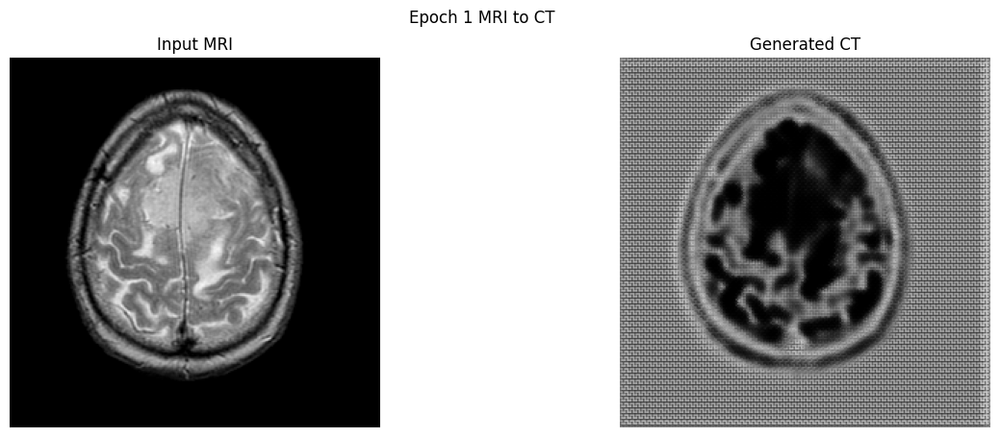

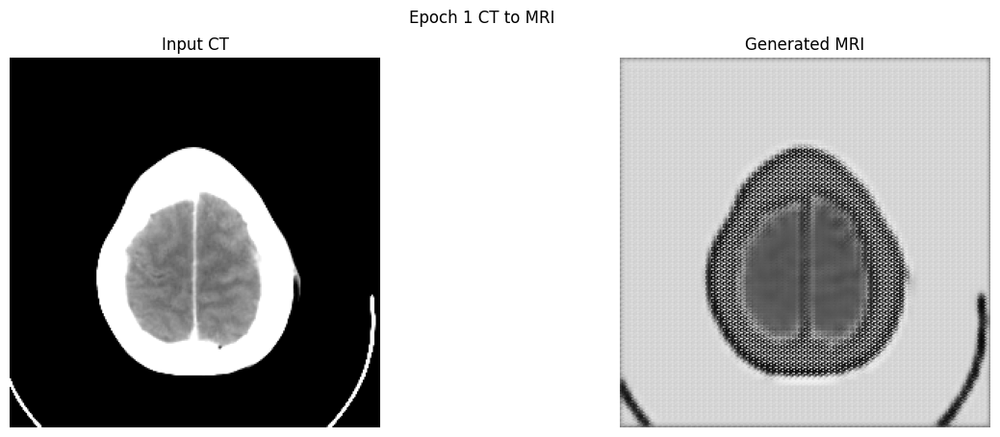

Epoch 1/15 completed


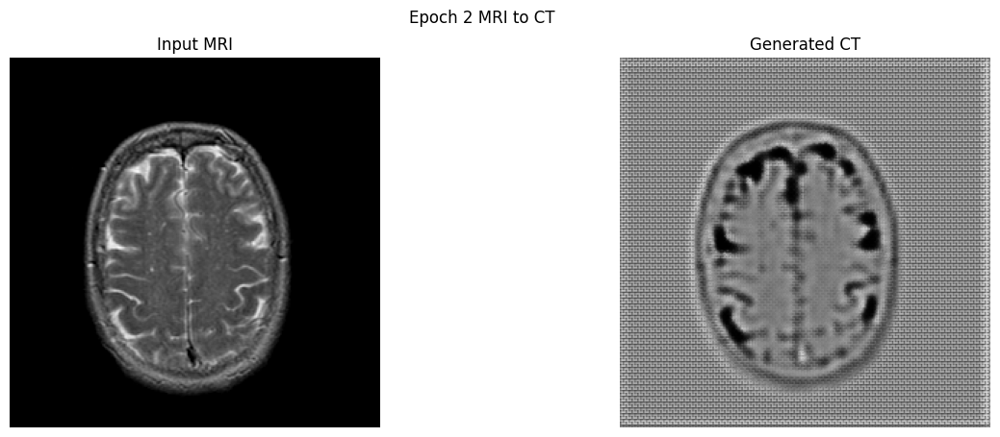

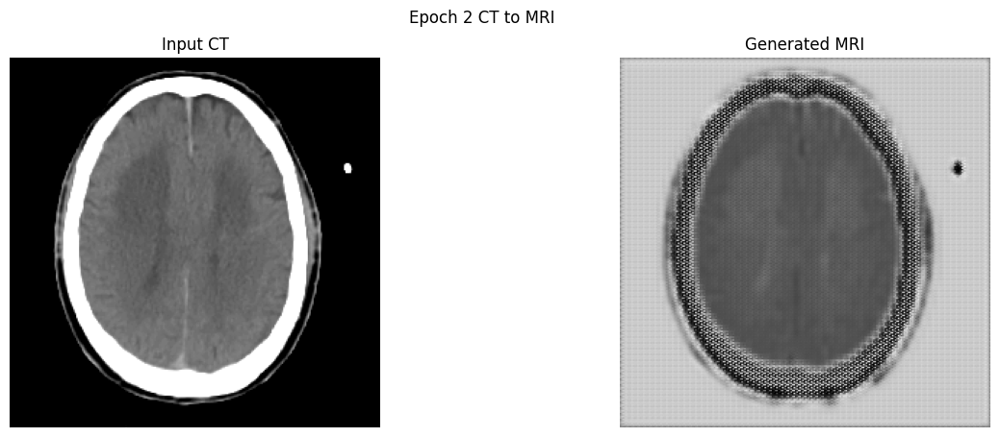

Epoch 2/15 completed


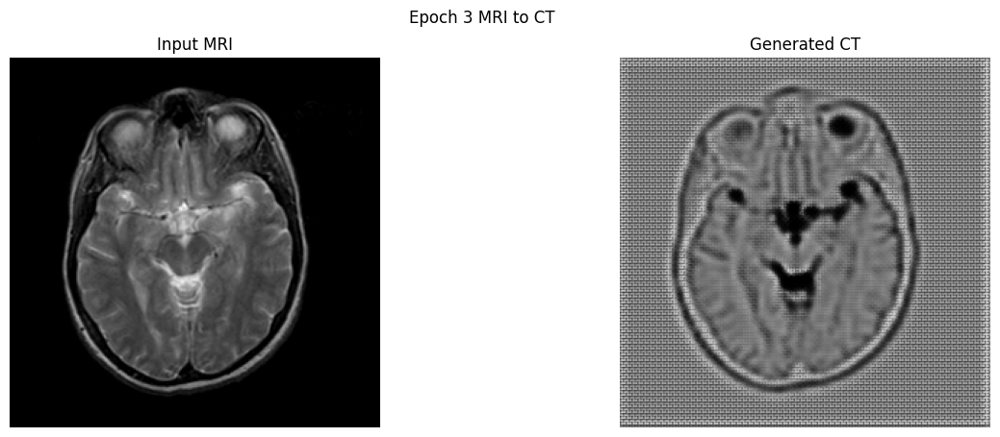

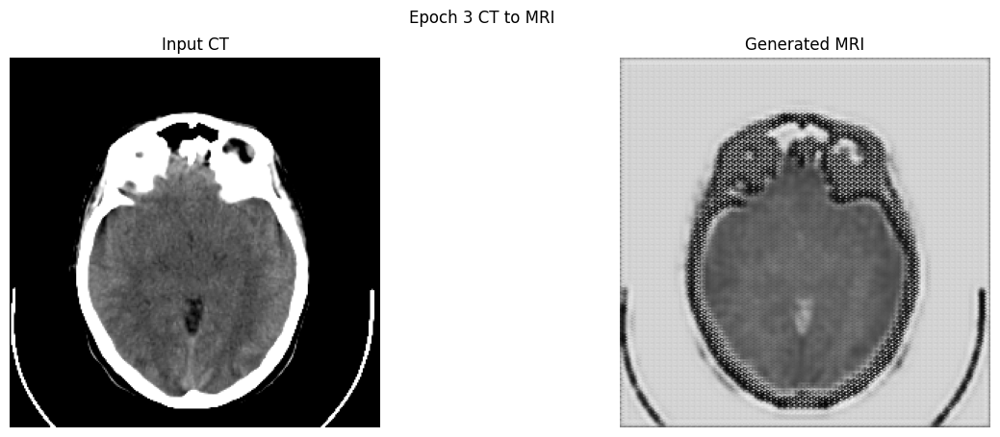

Epoch 3/15 completed


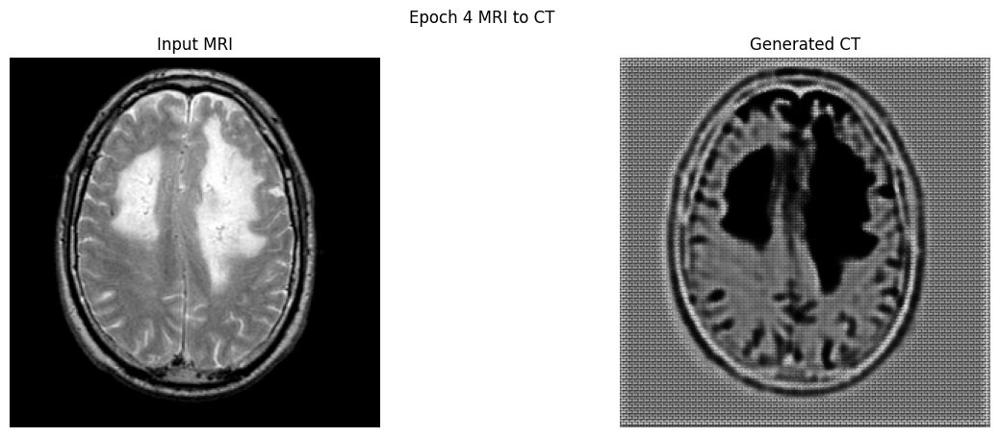

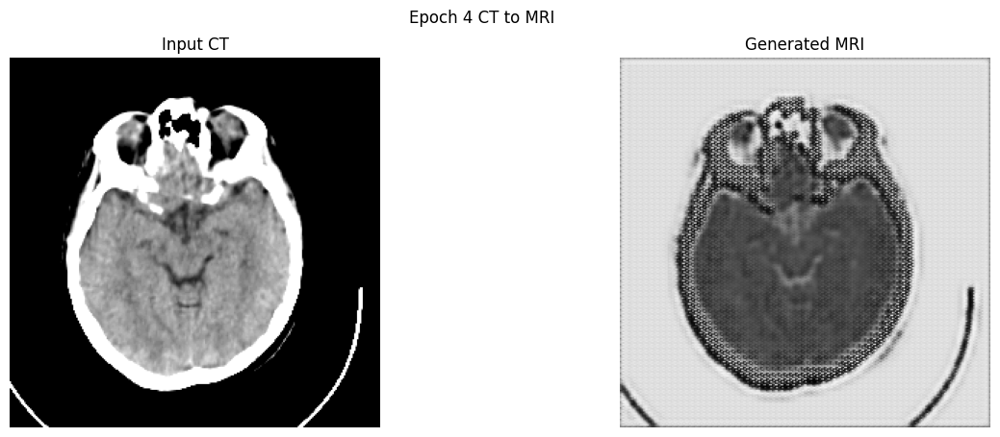

Epoch 4/15 completed


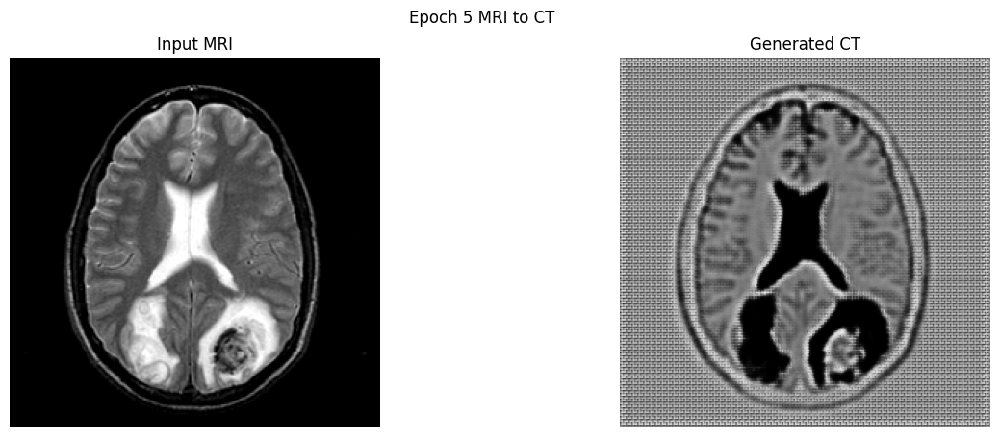

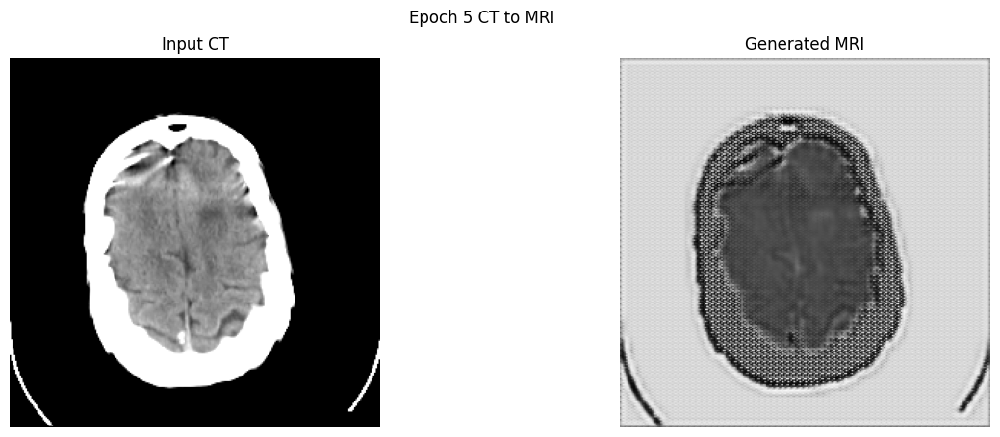

Epoch 5/15 completed


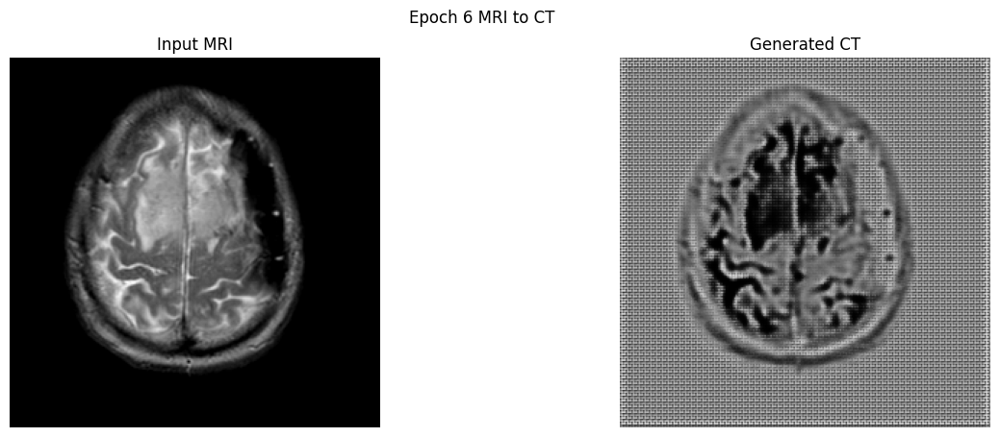

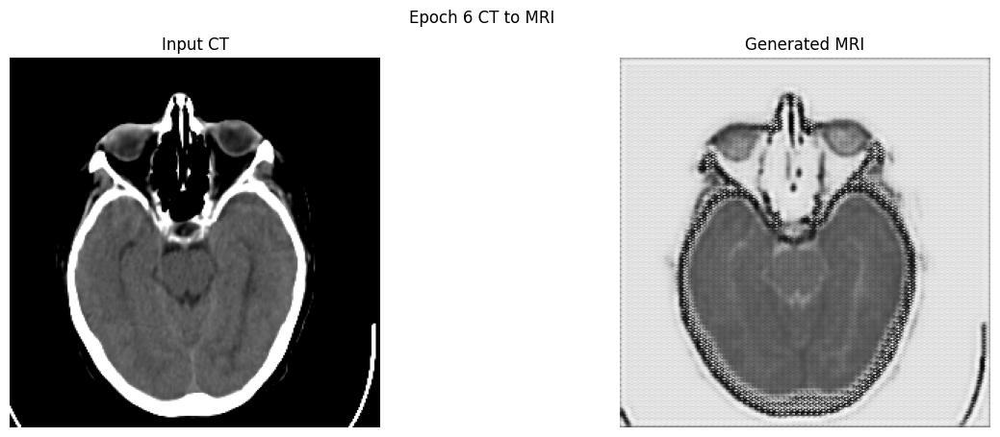

Epoch 6/15 completed


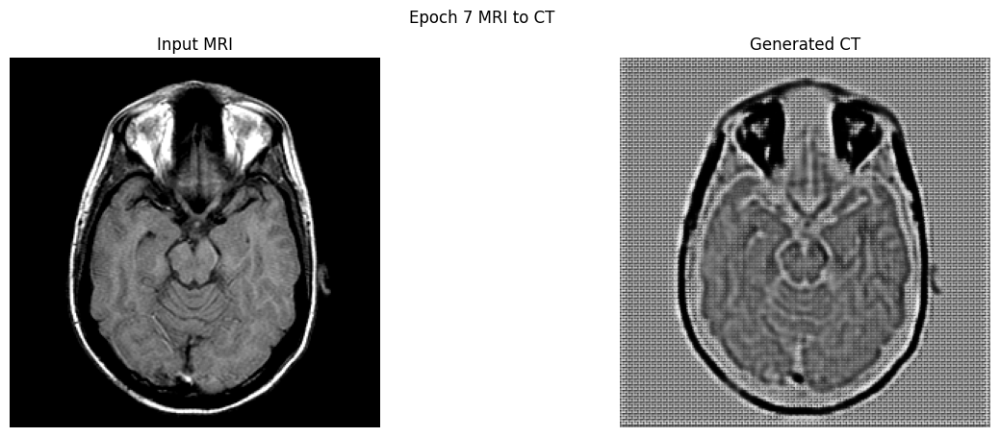

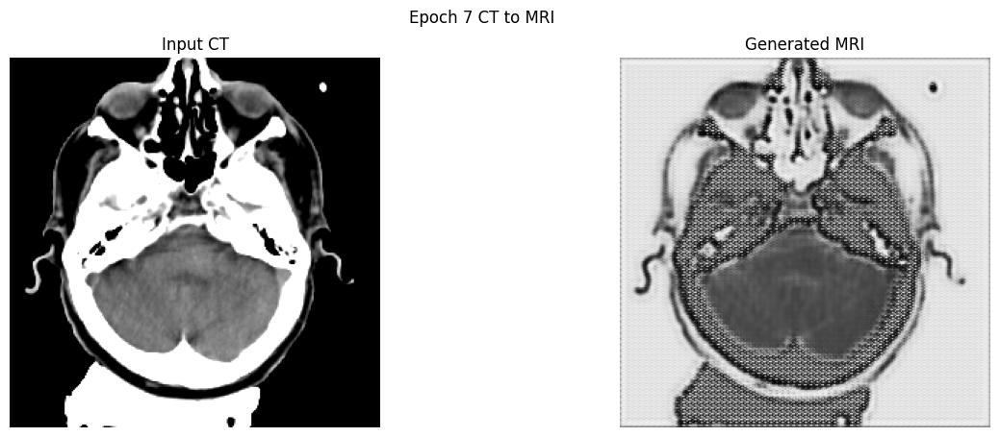

Epoch 7/15 completed


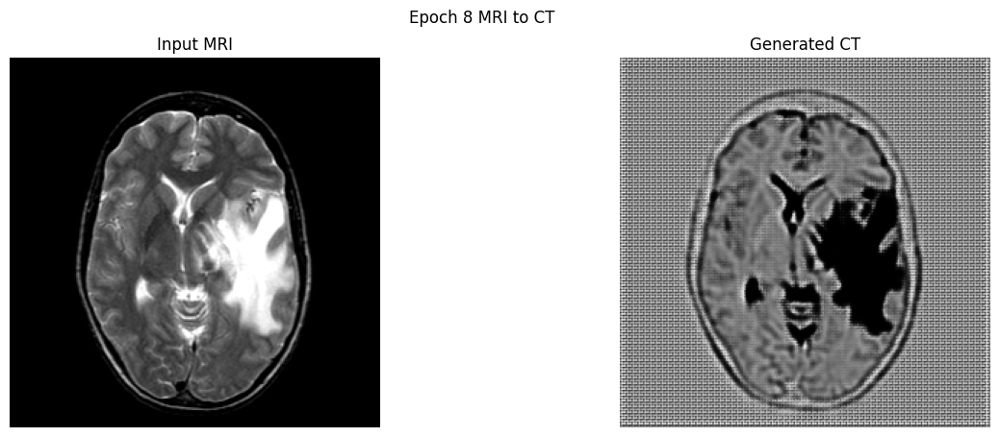

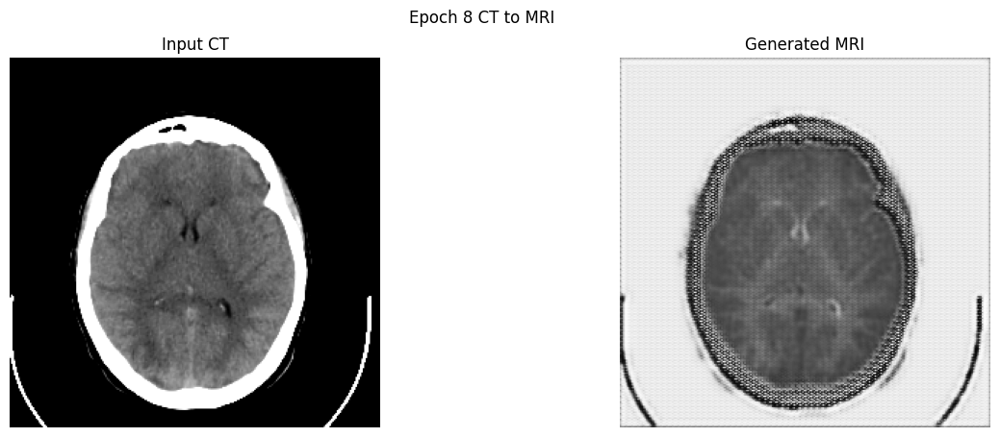

Epoch 8/15 completed


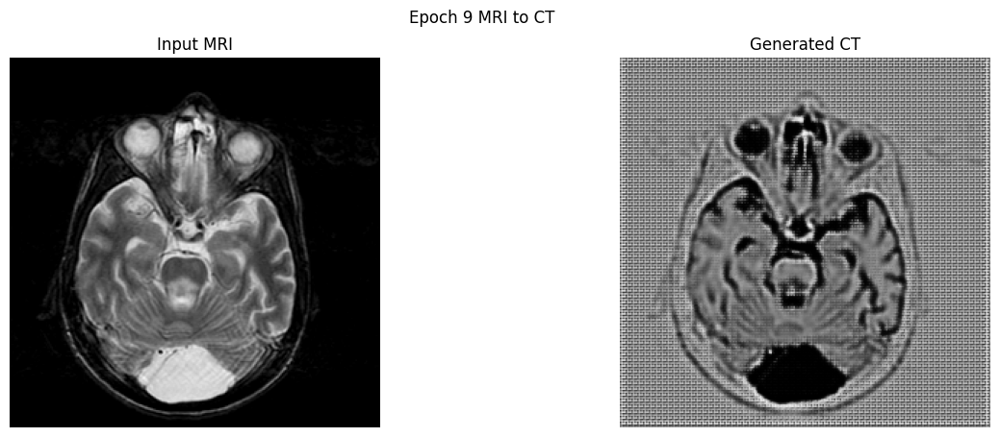

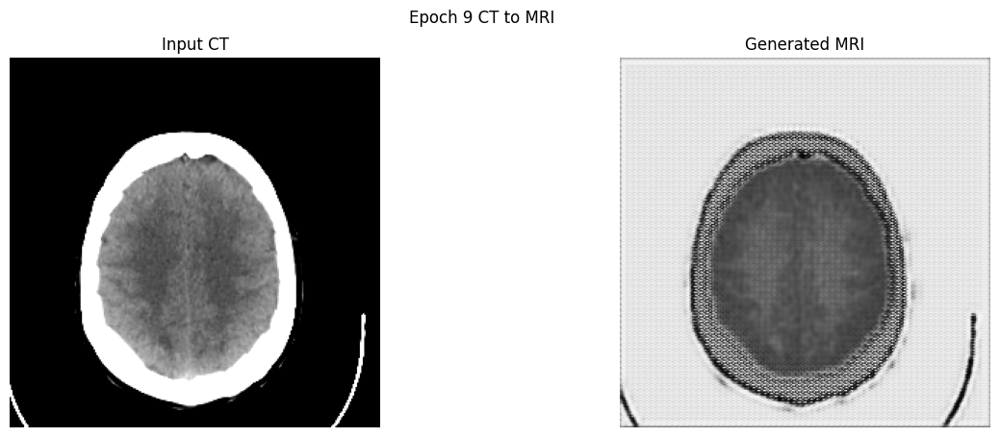

Epoch 9/15 completed


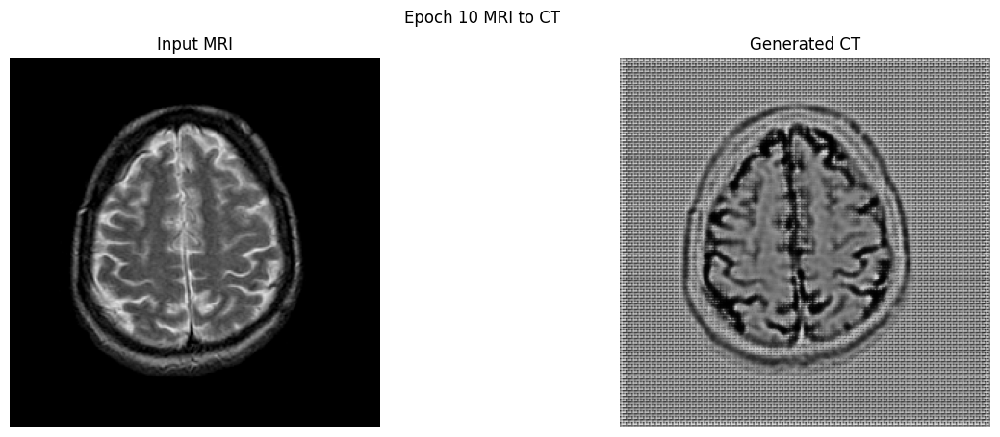

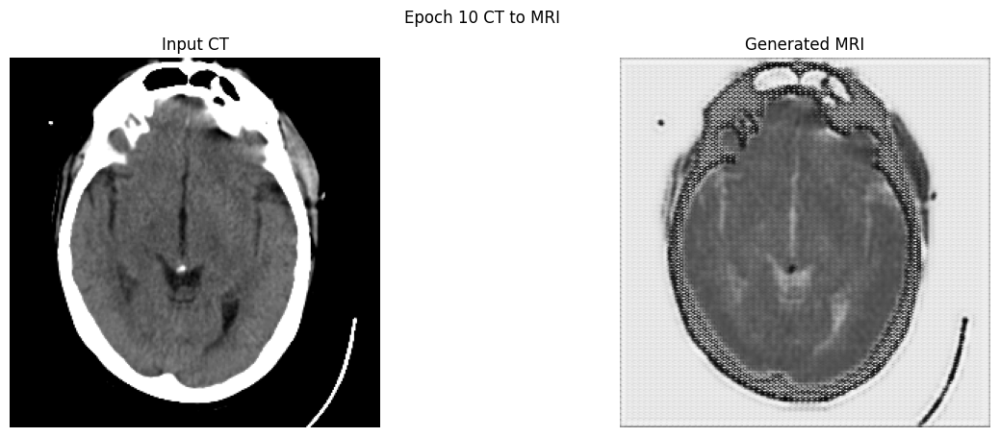

Epoch 10/15 completed


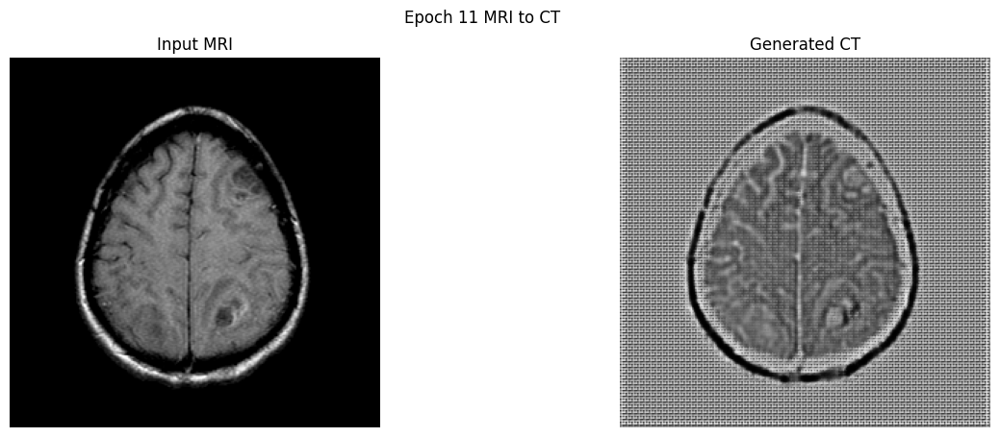

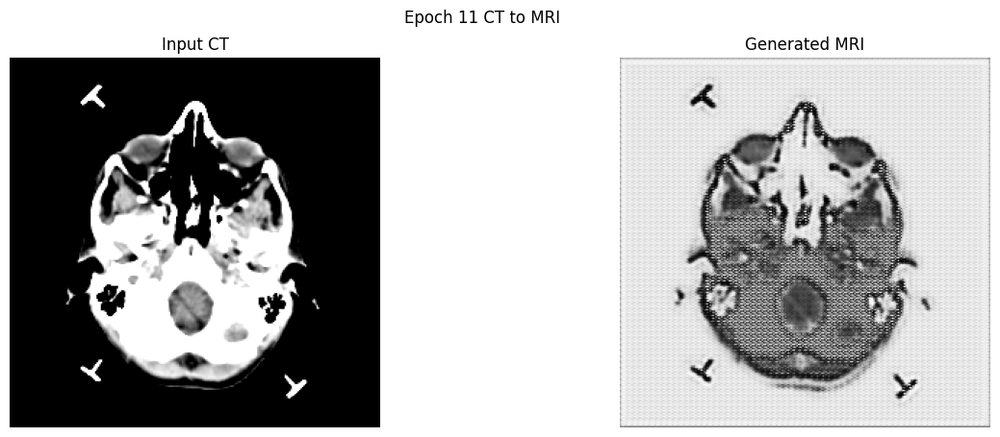

Epoch 11/15 completed


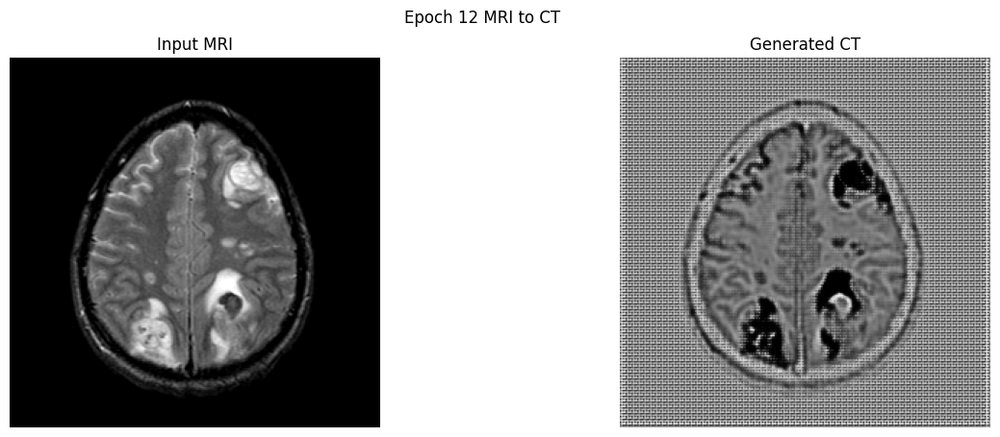

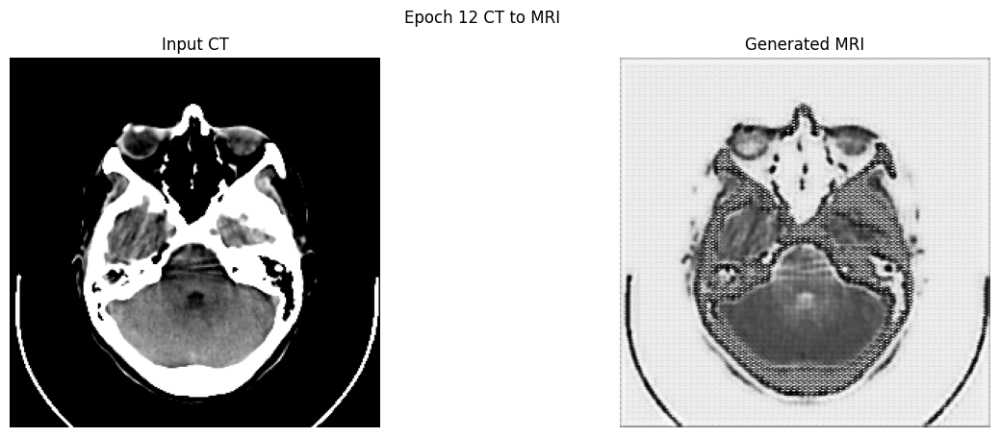

Epoch 12/15 completed


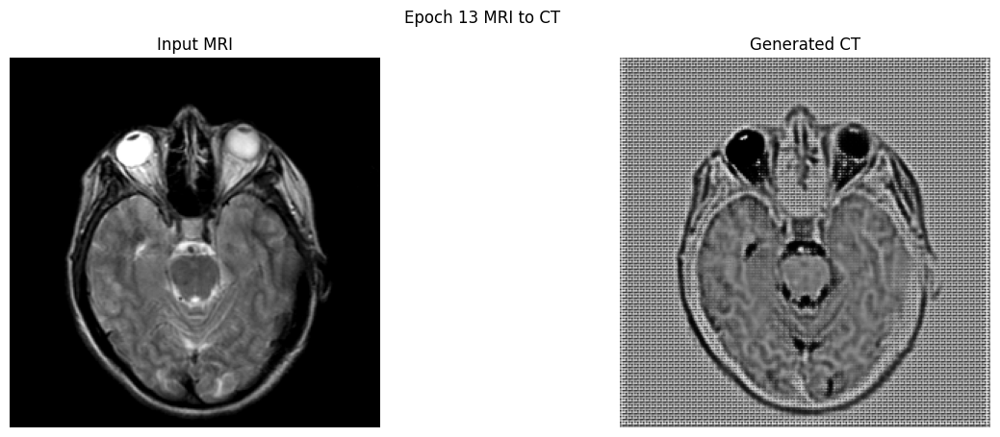

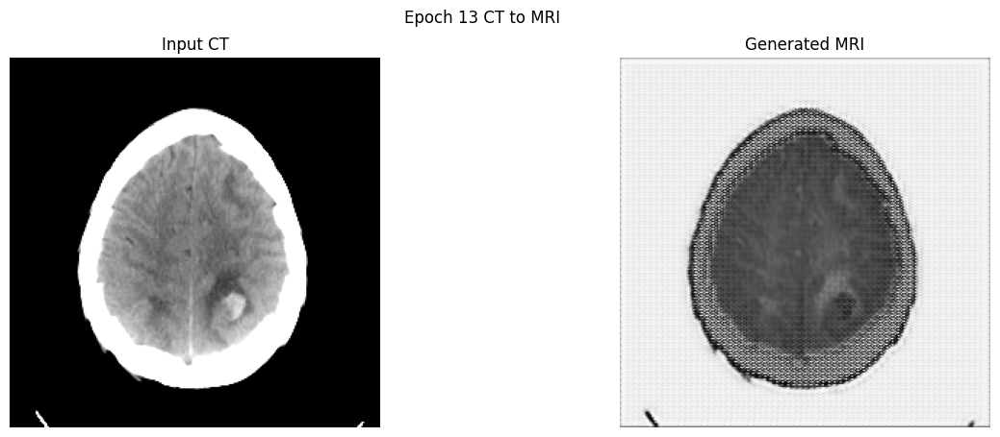

Epoch 13/15 completed


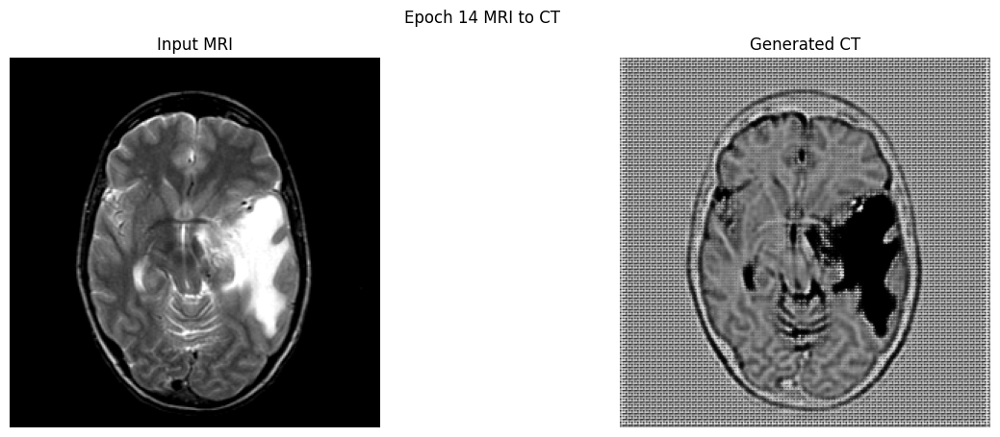

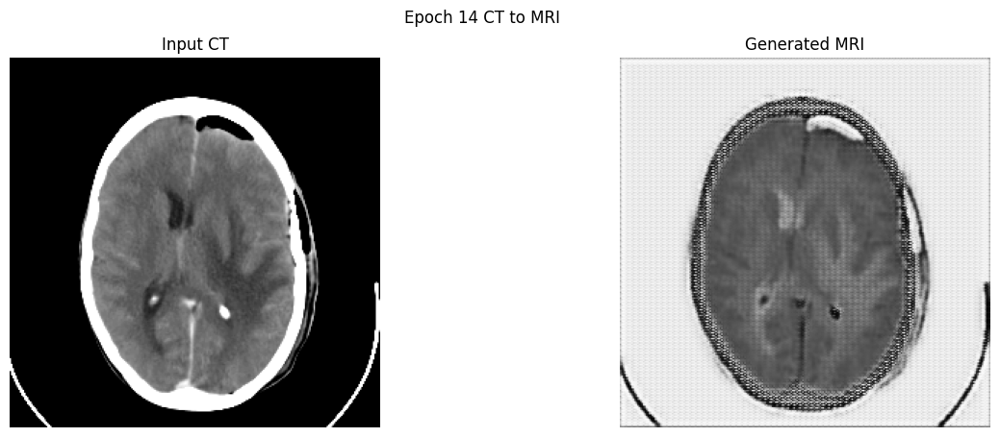

Epoch 14/15 completed


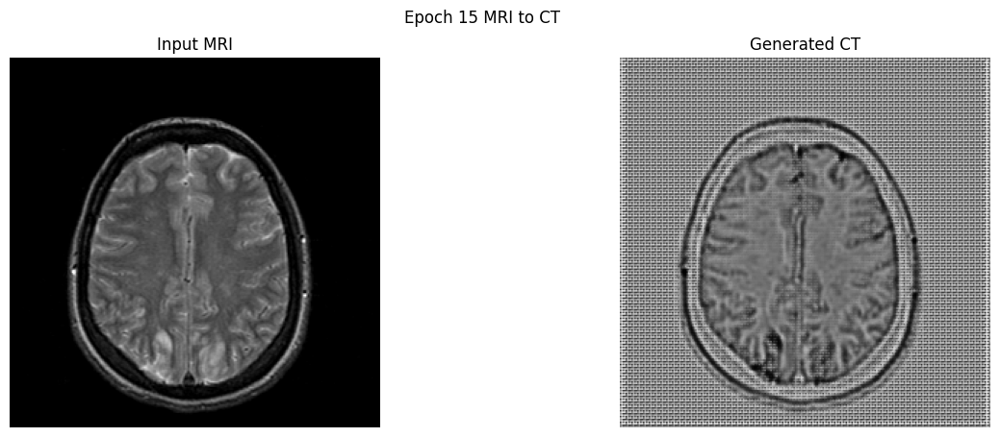

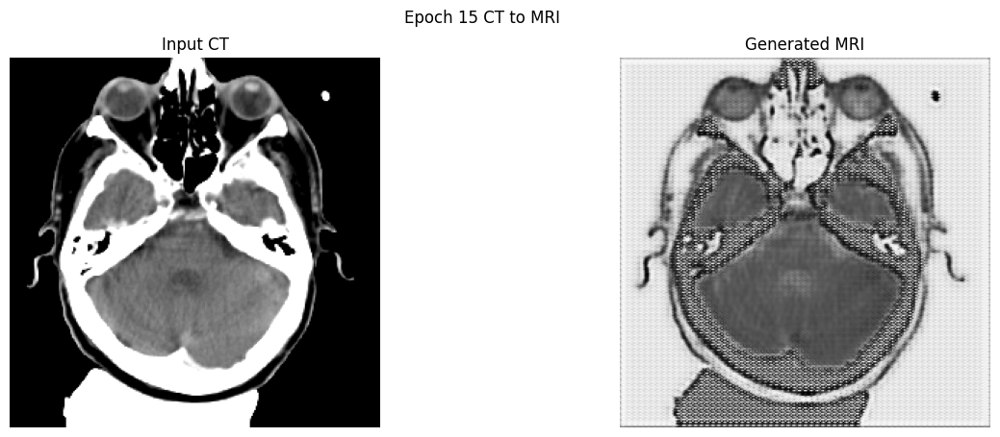

Epoch 15/15 completed


In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import matplotlib.pyplot as plt
import numpy as np

# Function to load and preprocess the dataset
def load_dataset(train_mri_dir, train_ct_dir, image_size=(256, 256), limit=None):
    train_mri = tf.data.Dataset.list_files(train_mri_dir + '/*.png')  # Adjust path and file extension as necessary
    train_mri = train_mri.map(lambda x: preprocess_image(x, image_size)).batch(1)
    train_ct = tf.data.Dataset.list_files(train_ct_dir + '/*.png')  # Adjust path and file extension as necessary
    train_ct = train_ct.map(lambda x: preprocess_image(x, image_size)).batch(1)

    if limit:
        train_mri = train_mri.take(limit)
        train_ct = train_ct.take(limit)

    return train_mri, train_ct

# Function to preprocess images
def preprocess_image(file_path, image_size):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=1)
    image = tf.image.resize(image, image_size)
    image = (image / 127.5) - 1
    return image

# Generator Model
def build_generator():
    inputs = layers.Input(shape=(256, 256, 1))
    x = layers.Conv2D(64, 4, strides=2, padding="same")(inputs)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128, 4, strides=2, padding="same")(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 4, strides=2, padding="same")(x)
    x = layers.ReLU()(x)
    outputs = layers.Conv2DTranspose(1, 4, strides=2, padding="same", activation="tanh")(x)
    return models.Model(inputs, outputs, name="Generator")

# Discriminator Model
def build_discriminator():
    inputs = layers.Input(shape=(256, 256, 1))
    x = layers.Conv2D(64, 4, strides=2, padding="same")(inputs)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128, 4, strides=2, padding="same")(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(1, activation="sigmoid")(x)
    return models.Model(inputs, x, name="Discriminator")

# Adversarial and Cycle Consistency Loss
def adversarial_loss(real, fake):
    real_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(real), real)
    fake_loss = tf.keras.losses.BinaryCrossentropy()(tf.zeros_like(fake), fake)
    return real_loss + fake_loss

def cycle_consistency_loss(real, reconstructed):
    return tf.reduce_mean(tf.abs(real - reconstructed))

# Training Step

@tf.function
def train_step(real_mri, real_ct, G_MtoC, G_CtoM, D_M, D_C, g_optimizer, d_optimizer):
    with tf.GradientTape(persistent=True) as tape:
        fake_ct = G_MtoC(real_mri, training=True)
        fake_mri = G_CtoM(real_ct, training=True)
        reconstructed_mri = G_CtoM(fake_ct, training=True)
        reconstructed_ct = G_MtoC(fake_mri, training=True)
        real_mri_output = D_M(real_mri, training=True)
        fake_mri_output = D_M(fake_mri, training=True)
        real_ct_output = D_C(real_ct, training=True)
        fake_ct_output = D_C(fake_ct, training=True)
        gen_loss = adversarial_loss(real_ct_output, fake_ct_output) + adversarial_loss(real_mri_output, fake_mri_output)
        cycle_loss = cycle_consistency_loss(real_mri, reconstructed_mri) + cycle_consistency_loss(real_ct, reconstructed_ct)
        total_gen_loss = gen_loss + 10 * cycle_loss
        disc_loss = adversarial_loss(real_mri_output, fake_mri_output) + adversarial_loss(real_ct_output, fake_ct_output)
    gen_gradients = tape.gradient(total_gen_loss, G_MtoC.trainable_variables + G_CtoM.trainable_variables)
    disc_gradients = tape.gradient(disc_loss, D_M.trainable_variables + D_C.trainable_variables)
    g_optimizer.apply_gradients(zip(gen_gradients, G_MtoC.trainable_variables + G_CtoM.trainable_variables))
    d_optimizer.apply_gradients(zip(disc_gradients, D_M.trainable_variables + D_C.trainable_variables))

# Visualization function
def visualize_images(title, images, col_titles=None):
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    fig.suptitle(title)
    if col_titles is None:
        col_titles = ['Image']*len(images)
    for i, (img, col_title) in enumerate(zip(images, col_titles)):
        axs[i].imshow(img[:, :, 0], cmap='gray', vmin=-1, vmax=1)
        axs[i].title.set_text(col_title)
        axs[i].axis('off')
    plt.show()

# Train the model with visualization
def train(train_mri, train_ct, epochs=20):
    G_MtoC = build_generator()  # MRI to CT Generator
    G_CtoM = build_generator()  # CT to MRI Generator
    D_M = build_discriminator()  # MRI Discriminator
    D_C = build_discriminator()  # CT Discriminator

    g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    d_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    # Convert datasets to lists for random access
    mri_list = list(train_mri.as_numpy_iterator())
    ct_list = list(train_ct.as_numpy_iterator())

    for epoch in range(epochs):
        # Training loop
        for real_mri, real_ct in zip(train_mri, train_ct):
            train_step(real_mri, real_ct, G_MtoC, G_CtoM, D_M, D_C, g_optimizer, d_optimizer)
        
        # Randomly select an example to visualize
        random_mri_index = np.random.randint(0, len(mri_list))
        random_ct_index = np.random.randint(0, len(ct_list))
        example_mri = mri_list[random_mri_index]
        example_ct = ct_list[random_ct_index]

        # Visualization of MRI to CT conversion
        visualize_images(f"Epoch {epoch+1} MRI to CT", [example_mri[0], G_MtoC(example_mri, training=False)[0]], ['Input MRI', 'Generated CT'])
        
        # Visualization of CT to MRI conversion
        visualize_images(f"Epoch {epoch+1} CT to MRI", [example_ct[0], G_CtoM(example_ct, training=False)[0]], ['Input CT', 'Generated MRI'])

        print(f'Epoch {epoch+1}/{epochs} completed')


if __name__ == "__main__":
    train_mri_dir = r'C:\Users\Admin\Desktop\datasets\mri2ct\trainMRI'
    train_ct_dir = r'C:\Users\Admin\Desktop\datasets\mri2ct\trainCT'
    train_mri, train_ct = load_dataset(train_mri_dir, train_ct_dir)
    train(train_mri, train_ct, epochs=15)


In [9]:
tf.keras.backend.clear_session()
